In [92]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
from fbprophet import Prophet

import os
print(os.listdir("./forecasted_11"))

['WIND_11.csv', 'CO_11.csv', '.DS_Store', 'PRESS_11.csv', 'AQI_11.csv', 'Ozone_11.csv', 'so2_11.csv', 'RH_DP_11.csv', 'NO_11.csv', 'particulates_pm10_mass_avg_11.csv', 'lead_avg_11.csv', 'TEMP_11.csv']


In [93]:
df1 = pd.read_csv('./forecasted_11/so2_11.csv',encoding= 'unicode_escape', parse_dates=['year_month'])
df2 = pd.read_csv('./forecasted_11/particulates_pm10_mass_avg_11.csv',encoding= 'unicode_escape', parse_dates=['year_month'])
df3 = pd.read_csv('./forecasted_11/RH_DP_11.csv',encoding= 'unicode_escape', parse_dates=['year_month'])
df4 = pd.read_csv('./forecasted_11/Ozone_11.csv',encoding= 'unicode_escape', parse_dates=['year_month'])
df5 = pd.read_csv('./forecasted_11/AQI_11.csv',encoding= 'unicode_escape', parse_dates=['year_month'])
df6 = pd.read_csv('./forecasted_11/PRESS_11.csv',encoding= 'unicode_escape', parse_dates=['year_month'])
df7 = pd.read_csv('./forecasted_11/WIND_11.csv',encoding= 'unicode_escape', parse_dates=['year_month'])
df8 = pd.read_csv('./forecasted_11/CO_11.csv',encoding= 'unicode_escape', parse_dates=['year_month'])
df9 = pd.read_csv('./forecasted_11/lead_avg_11.csv',encoding= 'unicode_escape', parse_dates=['year_month'])
df10 = pd.read_csv('./forecasted_11/NO_11.csv',encoding= 'unicode_escape', parse_dates=['year_month'])
df11 = pd.read_csv('./forecasted_11/TEMP_11.csv',encoding= 'unicode_escape', parse_dates=['year_month'])


In [94]:
df1.tail()

,year_month,County_Name,State_Name,so2
3053,2030-06-01,Hardin,Kentucky,4.193621
3054,2030-07-01,Hardin,Kentucky,4.193621
3055,2030-08-01,Hardin,Kentucky,4.193621
3056,2030-09-01,Hardin,Kentucky,4.193621
3057,2030-10-01,Hardin,Kentucky,4.193621


In [95]:
new_df = pd.merge(df1, df2,  how='outer', left_on=['year_month','County_Name','State_Name'], right_on = ['year_month','County_Name','State_Name'])
new_df = pd.merge(new_df, df3,  how='outer', left_on=['year_month','County_Name','State_Name'], right_on = ['year_month','County_Name','State_Name'])
new_df = pd.merge(new_df, df4,  how='outer', left_on=['year_month','County_Name','State_Name'], right_on = ['year_month','County_Name','State_Name'])
new_df = pd.merge(new_df, df5,  how='outer', left_on=['year_month','County_Name','State_Name'], right_on = ['year_month','County_Name','State_Name'])
new_df = pd.merge(new_df, df6,  how='outer', left_on=['year_month','County_Name','State_Name'], right_on = ['year_month','County_Name','State_Name'])
new_df = pd.merge(new_df, df7,  how='outer', left_on=['year_month','County_Name','State_Name'], right_on = ['year_month','County_Name','State_Name'])
new_df = pd.merge(new_df, df8,  how='outer', left_on=['year_month','County_Name','State_Name'], right_on = ['year_month','County_Name','State_Name'])
new_df = pd.merge(new_df, df9,  how='outer', left_on=['year_month','County_Name','State_Name'], right_on = ['year_month','County_Name','State_Name'])
new_df = pd.merge(new_df, df10,  how='outer', left_on=['year_month','County_Name','State_Name'], right_on = ['year_month','County_Name','State_Name'])
new_df = pd.merge(new_df, df11,  how='outer', left_on=['year_month','County_Name','State_Name'], right_on = ['year_month','County_Name','State_Name'])


In [129]:
final_df = new_df[new_df.year_month > '2020-01-01']
final_df

,year_month,County_Name,State_Name,so2,particulates_pm10_mass_avg,RH_DP,Ozone,AQI,PRESS,WIND,CO,lead_avg,NO,TEMP
7,2020-02-01,Los Angeles,California,0.330931,26.562132,193.981097,0.031029,88.790751,696.762365,96.294831,0.361178,0.003673,13.356847,65.782275
8,2020-03-01,Los Angeles,California,0.381107,27.774422,198.679229,0.032354,93.231570,698.001675,101.686036,0.351626,0.004673,13.584115,67.354855
9,2020-04-01,Los Angeles,California,0.327966,26.573763,193.167839,0.031117,88.852783,705.453724,96.458981,0.359508,0.003453,13.254217,65.849845
10,2020-05-01,Los Angeles,California,0.326447,25.901455,185.479501,0.031747,87.545719,713.035987,97.605832,0.350199,0.005357,12.732702,65.422448
11,2020-06-01,Los Angeles,California,0.347798,26.360628,183.168378,0.032675,88.152031,707.444154,93.794678,0.324357,0.005563,12.435257,65.233522
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3057,2030-10-01,Hardin,Kentucky,4.193621,NaN,NaN,0.028304,NaN,NaN,NaN,0.729752,NaN,12.811746,NaN
3061,2031-02-01,Los Angeles,California,NaN,26.935089,NaN,NaN,NaN,NaN,NaN,NaN,-0.017937,NaN,NaN
3062,2031-03-01,Los Angeles,California,NaN,26.074374,NaN,NaN,NaN,NaN,NaN,NaN,-0.017119,NaN,NaN
3175,2031-02-01,Miami-Dade,Florida,NaN,NaN,212.605480,NaN,NaN,83.990013,328.681101,NaN,NaN,NaN,84.793444


In [135]:
final_df = final_df.dropna()
final_df['so2'] = final_df.so2.abs()
final_df['CO'] = final_df.CO.abs()
final_df['NO'] = final_df.NO.abs()
final_df['lead_avg'] = final_df.lead_avg.abs()
final_df['Ozone'] = final_df.Ozone.abs()
final_df

,year_month,County_Name,State_Name,so2,particulates_pm10_mass_avg,RH_DP,Ozone,AQI,PRESS,WIND,CO,lead_avg,NO,TEMP
7,2020-02-01,Los Angeles,California,0.330931,26.562132,193.981097,0.031029,88.790751,696.762365,96.294831,0.361178,0.003673,13.356847,65.782275
8,2020-03-01,Los Angeles,California,0.381107,27.774422,198.679229,0.032354,93.231570,698.001675,101.686036,0.351626,0.004673,13.584115,67.354855
9,2020-04-01,Los Angeles,California,0.327966,26.573763,193.167839,0.031117,88.852783,705.453724,96.458981,0.359508,0.003453,13.254217,65.849845
10,2020-05-01,Los Angeles,California,0.326447,25.901455,185.479501,0.031747,87.545719,713.035987,97.605832,0.350199,0.005357,12.732702,65.422448
11,2020-06-01,Los Angeles,California,0.347798,26.360628,183.168378,0.032675,88.152031,707.444154,93.794678,0.324357,0.005563,12.435257,65.233522
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2905,2030-03-01,Hinds,Mississippi,4.242083,20.557159,86.606262,0.023832,39.826887,102.064635,99.866393,0.418390,0.005607,4.997963,74.932405
2906,2030-04-01,Hinds,Mississippi,2.642987,18.706139,89.715041,0.023069,39.416658,94.186682,101.822285,0.370645,0.008040,4.872337,76.390959
2907,2030-05-01,Hinds,Mississippi,3.332382,19.223406,82.275732,0.023966,38.608842,97.648890,95.175399,0.390364,0.006954,4.615004,73.848146
2908,2030-06-01,Hinds,Mississippi,3.596398,19.167951,89.129283,0.024165,41.658272,115.584300,102.800809,0.436868,0.003597,5.182975,78.956911


In [136]:
final_df.dropna().to_csv('./forecasted_11/simulated.csv',index=False)


In [89]:
final_df.dropna().County_Name.unique()

array(['Los Angeles', 'Harris', 'Maricopa', 'Hinds'], dtype=object)

In [68]:
from sklearn.linear_model import LinearRegression

In [69]:
reg = LinearRegression()

In [232]:
sim_df = pd.read_csv('./Simulated_X_Y.csv', index_col='year')
sim_df[sim_df.County_Name == 'Maricopa']

,County_Name,State_Name,AQI,PRESS,TEMP,RH_DP,NO,CO,so2,Ozone,PM10,WIND,LEAD,Disasters_By_Count
year,,,,,,,,,,,,,,
2024,Maricopa,Arizona,75.90,90.38,79.94,88.61,15.15,0.29,0.25,0.04,27.57,91.78,0.02,83
2023,Maricopa,Arizona,75.46,90.56,79.09,88.46,15.37,0.30,0.33,0.04,28.10,91.57,0.02,85
2020,Maricopa,Arizona,74.34,91.73,77.44,88.49,16.22,0.33,0.57,0.04,29.63,90.97,0.02,84
2026,Maricopa,Arizona,76.13,90.49,80.19,88.61,14.73,0.27,0.11,0.04,26.93,91.90,0.02,83
2025,Maricopa,Arizona,75.99,90.51,79.97,88.79,15.03,0.28,0.18,0.04,27.83,91.92,0.02,83
2021,Maricopa,Arizona,74.82,90.60,78.41,88.61,16.08,0.32,0.49,0.04,29.45,91.08,0.02,88
2028,Maricopa,Arizona,76.17,90.29,81.28,88.22,14.51,0.26,0.04,0.04,26.27,91.76,0.02,82
2029,Maricopa,Arizona,75.99,90.42,81.57,88.20,14.28,0.25,0.12,0.04,25.72,91.88,0.03,79
2030,Maricopa,Arizona,75.19,92.87,84.26,87.77,13.84,0.23,0.17,0.04,24.46,91.76,0.02,75


In [233]:
cty_df = sim_df[sim_df.State_Name == 'Arizona']
cty_df = cty_df[cty_df.County_Name == 'Maricopa']
cty_df = cty_df.sort_values(by='year')
cty_df = cty_df.iloc[:, 2:-1]
cty_df

,AQI,PRESS,TEMP,RH_DP,NO,CO,so2,Ozone,PM10,WIND,LEAD
year,,,,,,,,,,,
2020,74.34,91.73,77.44,88.49,16.22,0.33,0.57,0.04,29.63,90.97,0.02
2021,74.82,90.60,78.41,88.61,16.08,0.32,0.49,0.04,29.45,91.08,0.02
2022,74.91,90.58,78.83,88.30,15.68,0.31,0.41,0.04,28.72,90.96,0.02
2023,75.46,90.56,79.09,88.46,15.37,0.30,0.33,0.04,28.10,91.57,0.02
2024,75.90,90.38,79.94,88.61,15.15,0.29,0.25,0.04,27.57,91.78,0.02
2025,75.99,90.51,79.97,88.79,15.03,0.28,0.18,0.04,27.83,91.92,0.02
2026,76.13,90.49,80.19,88.61,14.73,0.27,0.11,0.04,26.93,91.90,0.02
2027,75.05,90.47,80.57,88.44,14.67,0.26,0.04,0.04,26.09,91.89,0.02
2028,76.17,90.29,81.28,88.22,14.51,0.26,0.04,0.04,26.27,91.76,0.02


In [234]:
column = 'NO'
percent = 50
year = 2030
right  = cty_df.loc[2030][column] * ( 1 - (percent/100.0))
left = cty_df.loc[2030][column]
# left - (year-2020) * k = right
k = (left - right) / (year-2020)
print(k)
i = 1
for index, row in cty_df.iterrows():
    print(row[column] - (k * (i + 1)))
    cty_df.loc[index][column] = row[column] - (k * (i + 1))
    i += 1

0.692
14.835999999999999
14.003999999999998
12.911999999999999
11.91
10.998000000000001
10.186
9.194
8.442
7.59
6.668
5.536000000000001


In [235]:
cty_df

,AQI,PRESS,TEMP,RH_DP,NO,CO,so2,Ozone,PM10,WIND,LEAD
year,,,,,,,,,,,
2020,74.34,91.73,77.44,88.49,14.836,0.33,0.57,0.04,29.63,90.97,0.02
2021,74.82,90.60,78.41,88.61,14.004,0.32,0.49,0.04,29.45,91.08,0.02
2022,74.91,90.58,78.83,88.30,12.912,0.31,0.41,0.04,28.72,90.96,0.02
2023,75.46,90.56,79.09,88.46,11.910,0.30,0.33,0.04,28.10,91.57,0.02
2024,75.90,90.38,79.94,88.61,10.998,0.29,0.25,0.04,27.57,91.78,0.02
2025,75.99,90.51,79.97,88.79,10.186,0.28,0.18,0.04,27.83,91.92,0.02
2026,76.13,90.49,80.19,88.61,9.194,0.27,0.11,0.04,26.93,91.90,0.02
2027,75.05,90.47,80.57,88.44,8.442,0.26,0.04,0.04,26.09,91.89,0.02
2028,76.17,90.29,81.28,88.22,7.590,0.26,0.04,0.04,26.27,91.76,0.02


In [236]:
import pickle

with open('./model.pkl', 'rb') as handle:
    model = pickle.load(handle)
    cty_df['Disasters_By_Count'] = model.predict(cty_df)
    print(cty_df)

        AQI  PRESS   TEMP  RH_DP      NO    CO   so2  Ozone   PM10   WIND  \
year                                                                        
2020  74.34  91.73  77.44  88.49  14.836  0.33  0.57   0.04  29.63  90.97   
2021  74.82  90.60  78.41  88.61  14.004  0.32  0.49   0.04  29.45  91.08   
2022  74.91  90.58  78.83  88.30  12.912  0.31  0.41   0.04  28.72  90.96   
2023  75.46  90.56  79.09  88.46  11.910  0.30  0.33   0.04  28.10  91.57   
2024  75.90  90.38  79.94  88.61  10.998  0.29  0.25   0.04  27.57  91.78   
2025  75.99  90.51  79.97  88.79  10.186  0.28  0.18   0.04  27.83  91.92   
2026  76.13  90.49  80.19  88.61   9.194  0.27  0.11   0.04  26.93  91.90   
2027  75.05  90.47  80.57  88.44   8.442  0.26  0.04   0.04  26.09  91.89   
2028  76.17  90.29  81.28  88.22   7.590  0.26  0.04   0.04  26.27  91.76   
2029  75.99  90.42  81.57  88.20   6.668  0.25  0.12   0.04  25.72  91.88   
2030  75.19  92.87  84.26  87.77   5.536  0.23  0.17   0.04  24.46  91.76   

/anaconda3/envs/hw-1/lib/python3.7/site-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator DecisionTreeRegressor from version 0.19.2 when using version 0.22.1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)
/anaconda3/envs/hw-1/lib/python3.7/site-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator RandomForestRegressor from version 0.19.2 when using version 0.22.1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


In [176]:
cty_df.to_json(orient='index')

'{"2024":{"AQI":75.9,"PRESS":90.38,"TEMP":79.94,"RH_DP":88.61,"NO":15.15,"CO":0.29,"so2":0.25,"Ozone":0.04,"PM10":27.57,"WIND":91.78,"LEAD":0.02,"Disasters_By_Count":83.4101849297},"2023":{"AQI":75.46,"PRESS":90.56,"TEMP":79.09,"RH_DP":88.46,"NO":15.37,"CO":0.3,"so2":0.33,"Ozone":0.04,"PM10":28.1,"WIND":91.57,"LEAD":0.02,"Disasters_By_Count":85.8254264971},"2020":{"AQI":74.34,"PRESS":91.73,"TEMP":77.44,"RH_DP":88.49,"NO":16.22,"CO":0.33,"so2":0.57,"Ozone":0.04,"PM10":29.63,"WIND":90.97,"LEAD":0.02,"Disasters_By_Count":84.3352574405},"2026":{"AQI":76.13,"PRESS":90.49,"TEMP":80.19,"RH_DP":88.61,"NO":14.73,"CO":0.27,"so2":0.11,"Ozone":0.04,"PM10":26.93,"WIND":91.9,"LEAD":0.02,"Disasters_By_Count":83.0630098304},"2025":{"AQI":75.99,"PRESS":90.51,"TEMP":79.97,"RH_DP":88.79,"NO":15.03,"CO":0.28,"so2":0.18,"Ozone":0.04,"PM10":27.83,"WIND":91.92,"LEAD":0.02,"Disasters_By_Count":83.3940911797},"2021":{"AQI":74.82,"PRESS":90.6,"TEMP":78.41,"RH_DP":88.61,"NO":16.08,"CO":0.32,"so2":0.49,"Ozone":0.

In [ ]:
train = pd.read_csv('./X_Y_updated_with_weka.csv')

In [71]:
X = train.drop("Disasters_By_Count", axis=1)
y = train["Disasters_By_Count"]

In [72]:
X = X.drop("County_Name", axis=1)
X = X.drop("State_Name", axis=1)
X = X.drop("year", axis=1)
X

,AQI,PRESS,TEMP,RH_DP,NO,CO,so2,Ozone,PM10,WIND,LEAD
0,63.78,320.97096,181.449441,156.696931,0.00,0.00,0.00,0.04,19.659924,97.553257,0.046409
1,44.68,108.28000,108.280000,108.280000,0.00,0.00,0.00,0.03,19.659924,108.280000,0.046409
2,42.61,320.97096,181.449441,156.696931,3.21,0.00,0.00,0.04,21.190000,97.553257,0.000000
3,34.93,320.97096,181.449441,156.696931,0.00,0.00,0.00,0.03,19.659924,97.553257,0.046409
4,53.65,93.13000,79.270000,79.270000,0.00,0.00,0.00,0.04,19.659924,93.130000,0.046409
...,...,...,...,...,...,...,...,...,...,...,...
21793,29.80,320.97096,181.449441,156.696931,0.00,0.00,0.00,0.02,19.659924,97.553257,0.046409
21794,48.70,96.54000,80.700000,69.020000,0.00,0.00,0.00,0.04,19.659924,96.540000,0.046409
21795,48.89,320.97096,181.449441,156.696931,6.00,0.00,0.00,0.04,0.000000,97.553257,0.850000
21796,38.74,320.97096,181.449441,156.696931,0.00,0.00,0.00,0.03,19.659924,97.553257,0.046409


In [73]:
model = reg.fit(X,y)

In [74]:
model

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [75]:
import pickle
with open('model.pickle', 'wb') as handle:
    pickle.dump(model, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [110]:
X_test = final_df

In [111]:
X_test = X_test.drop("year_month", axis=1)
X_test = X_test.drop("County_Name", axis=1)
X_test = X_test.drop("State_Name", axis=1)

In [103]:
X_test = X_test[X_test > 0]
X_test = X_test.dropna()

In [112]:
X_test['Disasters_By_Count'] = model.predict(X_test)

In [116]:
X_test['year_month'] = final_df['year_month']
X_test['County_Name'] = final_df['County_Name']
X_test['State_Name'] = final_df['State_Name']

In [120]:
X_test.to_csv('TOTAL.csv',index=False)


In [121]:
new_df = pd.read_csv('./TOTAL.csv')

In [124]:
new_df[new_df.County_Name == 'Sacramento']

,so2,particulates_pm10_mass_avg,RH_DP,Ozone,AQI,PRESS,WIND,CO,lead_avg,NO,TEMP,Disasters_By_Count,year_month,County_Name,State_Name
0,0.882916,13.968428,76.262491,0.039176,82.025016,78.541729,102.090694,0.151723,-0.000250,4.954156,76.063108,-1019.919925,2019-08-01,Sacramento,California
1,0.550493,24.145997,67.944240,0.036864,73.100245,68.124537,97.953659,0.202383,0.001124,6.182436,74.884841,-992.290667,2019-09-01,Sacramento,California
2,1.085871,33.152256,70.208497,0.028903,57.598384,70.923540,97.064984,0.297841,0.004272,8.851288,68.723408,-921.971767,2019-10-01,Sacramento,California
3,1.107761,30.667543,74.425611,0.018375,57.224177,76.539379,96.825973,0.443526,0.003181,7.542851,52.935879,-737.905608,2019-11-01,Sacramento,California
4,1.035184,18.017839,76.228721,0.015555,56.886682,78.810797,96.134634,0.423761,0.000475,6.486598,49.637043,-701.580411,2019-12-01,Sacramento,California
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127,0.691439,13.732040,-28.905742,0.029550,33.386199,-120.131088,97.859520,0.086478,0.001964,1.370816,59.945412,-649.906614,2030-03-01,Sacramento,California
128,0.590008,16.359092,-31.284967,0.036052,40.832868,-122.683660,106.390574,0.068520,0.001900,1.240928,63.955250,-701.681526,2030-04-01,Sacramento,California
129,0.596091,17.938101,-35.463396,0.038891,49.219257,-137.276417,101.819837,0.046877,0.001674,1.104904,66.329111,-710.198655,2030-05-01,Sacramento,California
130,0.796735,18.089618,-37.419572,0.039429,58.638745,-138.191131,106.897270,0.038059,0.000418,1.084107,79.195747,-862.662448,2030-06-01,Sacramento,California


In [3]:
train = pd.read_csv('./X_Y_updated_with_weka.csv')

In [17]:
train.County_Name.unique()

# BERKSHIRE


array(['ABBEVILLE', 'ADAMS', 'AIKEN', 'ANDERSON', 'ARAPAHOE', 'AROOSTOOK',
       'BARNSTABLE', 'BEAVER', 'BERKSHIRE', 'BOLIVAR', 'BOONE',
       'BRAZORIA', 'BROWARD', 'BUCKS', 'BURLINGTON', 'BUTLER',
       'CALCASIEU', 'CAMPBELL', 'CARTERET', 'CENTRE', 'CHARLES',
       'CHEROKEE', 'CLARK', 'CLINTON', 'COLLIER', 'COLUMBIA', 'COMANCHE',
       'CRITTENDEN', 'DEKALB', 'DURHAM', 'DUVAL', "'EAST BATON ROUGE'",
       'EDGEFIELD', 'EDMONSON', 'ERIE', 'ESCAMBIA', 'FLATHEAD', 'FLOYD',
       "'FOND DU LAC'", 'GALVESTON', 'GEAUGA', 'GENESEE', 'GILA',
       'GILMER', 'GLOUCESTER', 'GRANVILLE', 'GREENE', 'GUNNISON',
       'HENRICO', 'HUNTERDON', 'JACKSON', 'JEFFERSON', "'JO DAVIESS'",
       'JOHNSTON', 'KENNEBEC', 'KENT', 'KNOX', "'LA CROSSE'", 'LARIMER',
       'LEE', 'LEELANAU', 'LEHIGH', 'LICKING', 'LIVINGSTON', 'MADISON',
       'MASON', 'MCCLAIN', 'MCKENZIE', 'MEDINA', 'MIAMI-DADE',
       'MINNEHAHA', 'MOBILE', 'MONROE', 'MONTEREY', 'MORGAN', 'MUSCOGEE',
       "'NEW CASTLE'", "'NEW 

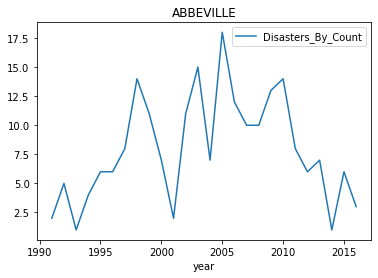

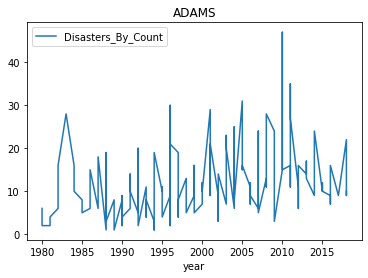

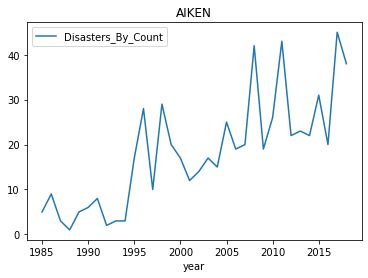

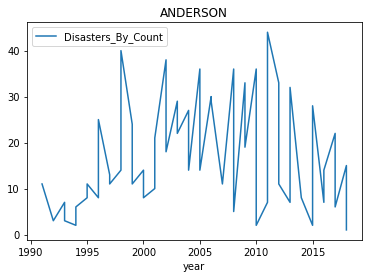

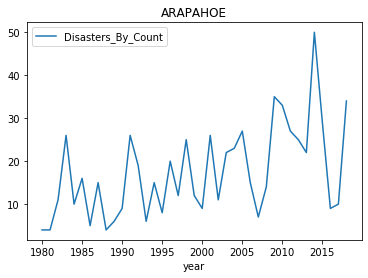

...

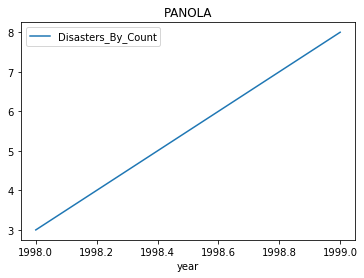

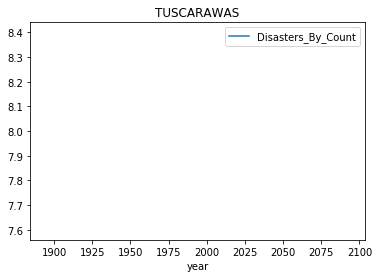

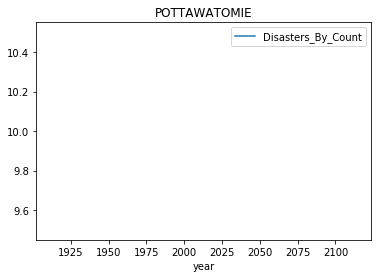

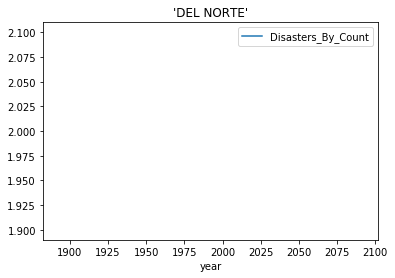

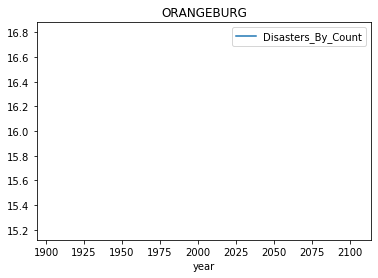

In [58]:
for tty in train.County_Name.unique():
    ct_Data  = train[train.County_Name == tty]
    ct_Data = ct_Data[['year','Disasters_By_Count']]
    ct_Data = ct_Data.sort_values(by=['year'])
#     ct_Data['MA'] = ct_Data['Disasters_By_Count'].rolling(3).mean()
#     ct_Data.plot(x='year', y='MA')
#     plt.title(tty)
    ct_Data.plot(x='year', y='Disasters_By_Count')
    plt.title(tty)
    plt.show()
    train[train.County_Name == tty].head(1)

In [10]:
ct_Data

,year,Disasters_By_Count
0,1999,11
1043,2009,13
3312,2016,3
3433,1992,5
4115,2014,1
4595,2015,6
5766,2001,2
5965,1991,2
6370,2002,11
6371,2010,14
